<a href="https://colab.research.google.com/github/JoeJoe1313/UDA/blob/main/train_test_100mb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Dec 31 20:10:26 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0              45W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

# Clone Project GitHub Repository

In [ ]:
# clone project repository
!git clone https://github.com/JoeJoe1313/UDA.git

Cloning into 'UDA'...
remote: Enumerating objects: 599, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 599 (delta 8), reused 15 (delta 4), pack-reused 572
Receiving objects: 100% (599/599), 80.40 MiB | 16.05 MiB/s, done.
Resolving deltas: 100% (185/185), done.


In [ ]:
# change working directory
%cd /content/UDA/

/content/UDA


# Train, Validation and Testing of the Model

In [ ]:
%run train_model.py

Train dataset shape (178, 2) with 8 unique patients.
Validation dataset shape (45, 2) with 2 unique patients.
Test dataset shape: (113, 2) with 2 unique patients.


100%|██████████| 94/94 [03:16<00:00,  2.09s/it]


In [ ]:
%run process_models.py

100%|██████████| 94/94 [00:12<00:00,  7.46it/s]


In [ ]:
%run test_model.py

Best epoch is 75
Test Loss: 0.042610959615558386, Test IoU: 0.6155460178852081


# Results Visualisations and Predictions

In [ ]:
import matplotlib.pyplot as plt
import torch
from PIL import Image

from constants import ModelConstants
from unet import UNet
from utils import diagnosis, predict_mask, print_res

In [ ]:
results

,training_loss,training_iou,validation_loss,validation_iou
epoch,,,,
0,0.482406,0.110016,0.467021,6.514423e-01
1,0.307730,0.412918,0.530275,8.374070e-03
2,0.261604,0.485877,0.565545,4.470417e-11
3,0.225859,0.553783,0.240138,7.302817e-01
4,0.199615,0.588517,0.228437,6.974391e-01
...,...,...,...,...
89,0.010093,0.879511,0.015417,7.912572e-01
90,0.010378,0.866475,0.017663,7.632451e-01
91,0.010578,0.870508,0.016721,7.848217e-01


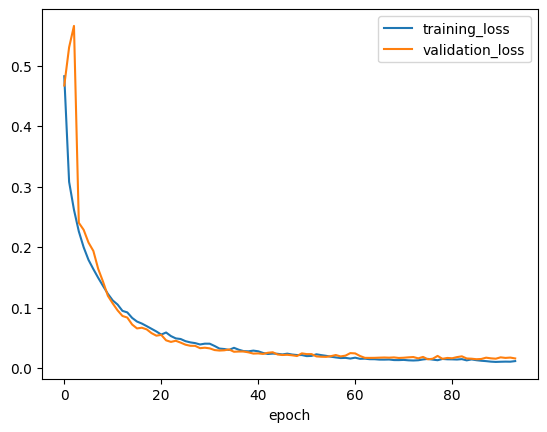

In [ ]:
results[["training_loss", "validation_loss"]].plot()
plt.show()

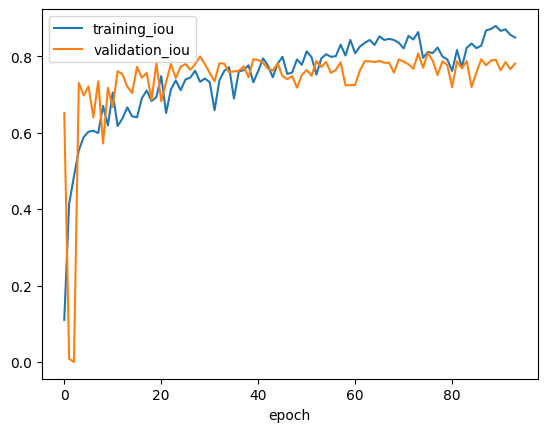

In [ ]:
results[["training_iou", "validation_iou"]].plot()
plt.show()

In [ ]:
df_test["tumor"] = df_test["mask_path"].apply(lambda m: diagnosis(m))
tumors = df_test[df_test["tumor"] == True]
no_tumors = df_test[df_test["tumor"] == False]

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(ModelConstants.N_CHANNELS, ModelConstants.N_CLASSES)
model.to(device)
checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, moment

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_19.tif


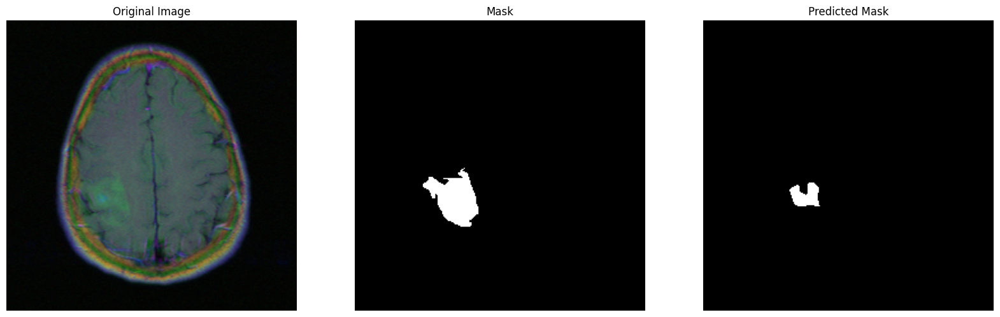

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_18.tif


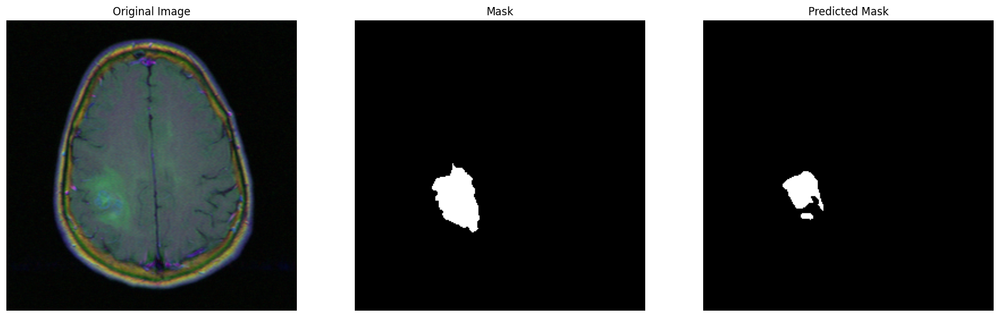

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_16.tif


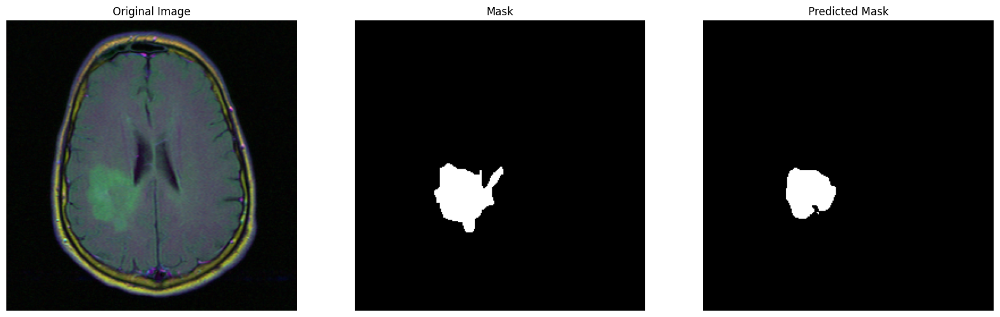

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_20.tif


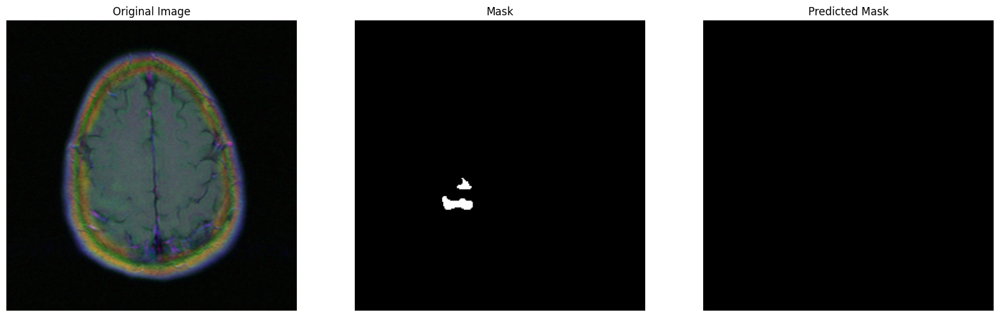

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_17.tif


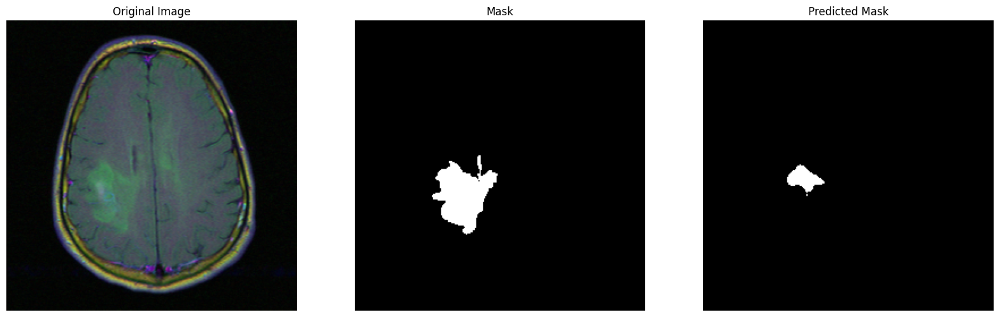

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_15.tif


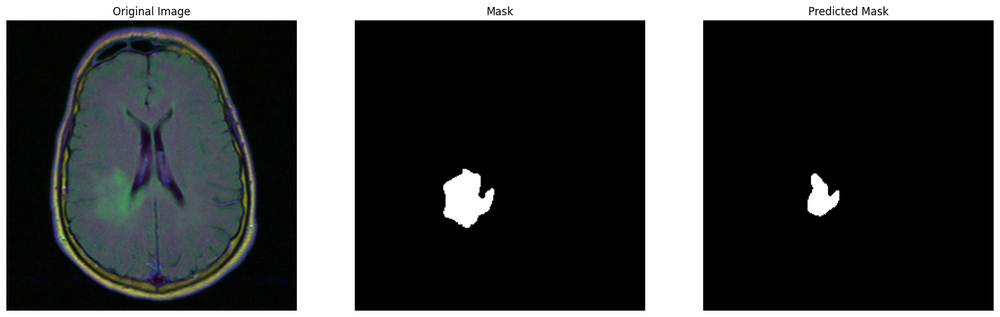

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_32.tif


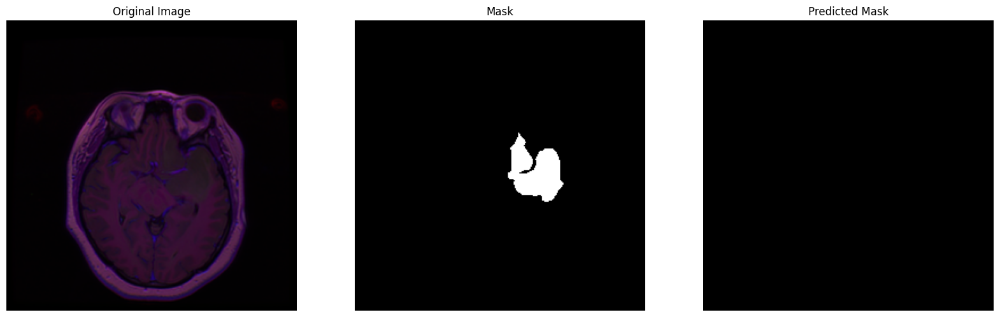

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_50.tif


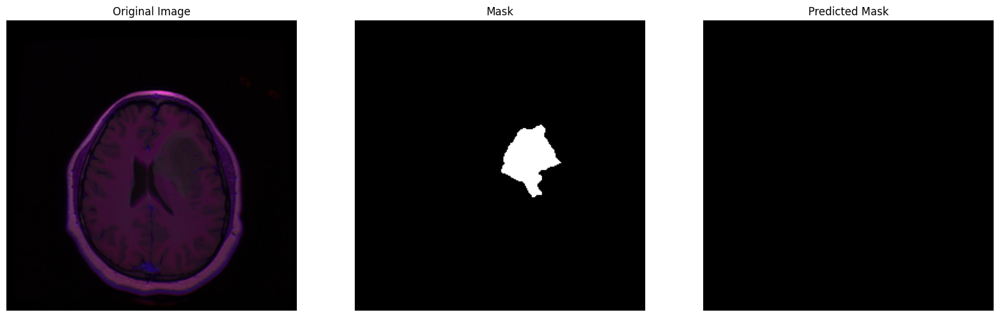

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_28.tif


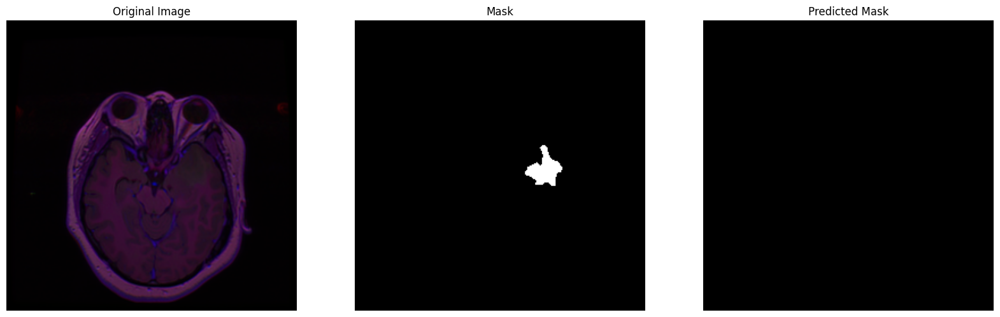

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_37.tif


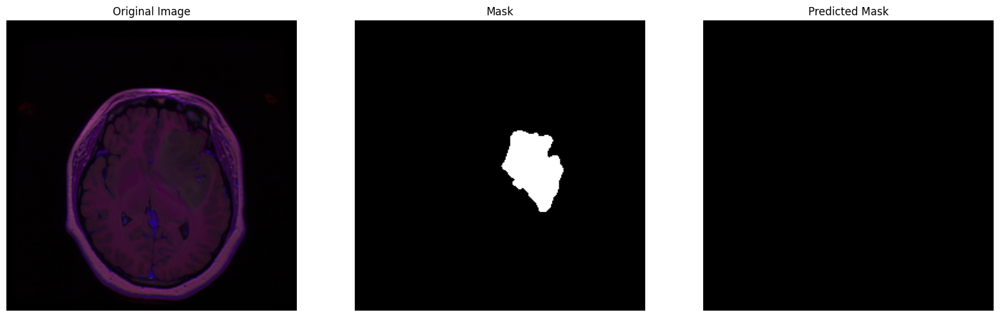

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_22.tif


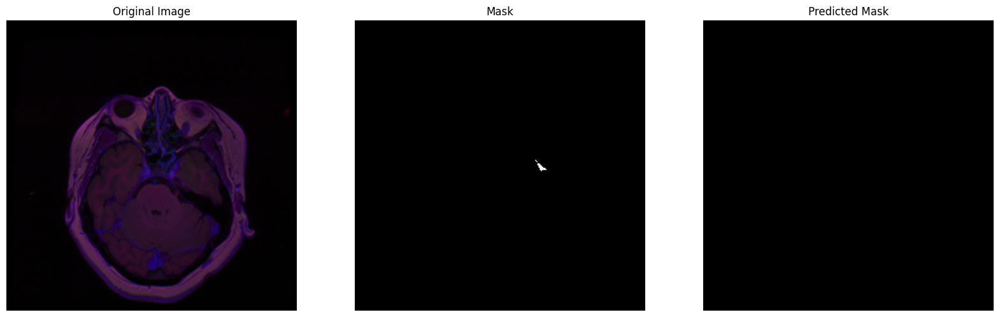

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_46.tif


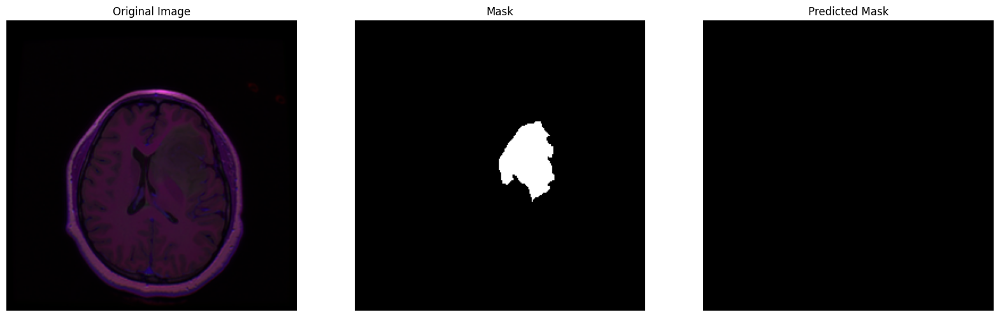

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_44.tif


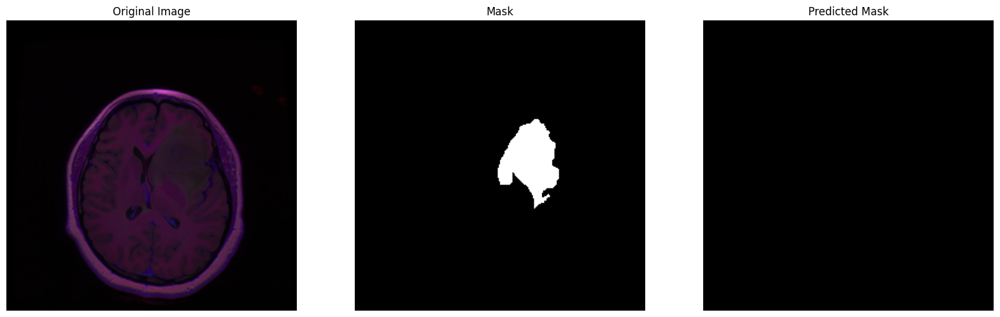

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_36.tif


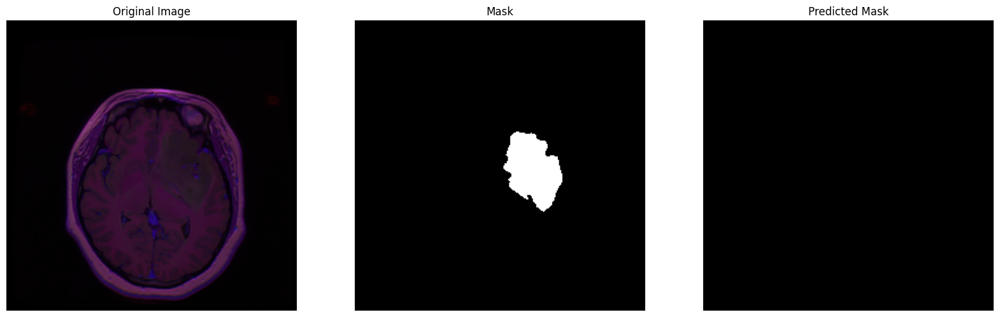

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_52.tif


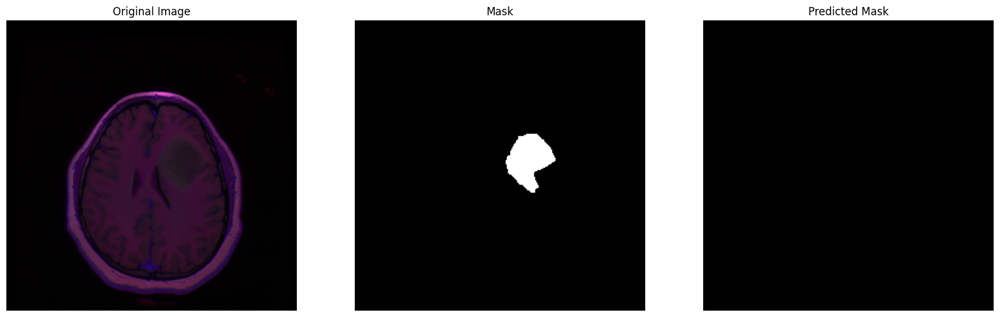

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_51.tif


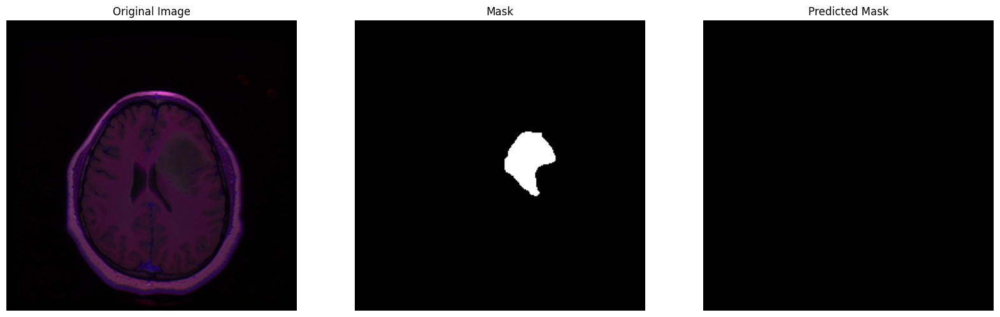

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_34.tif


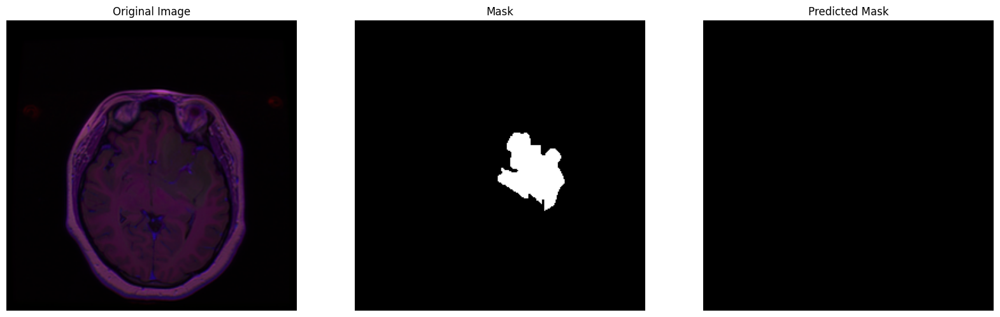

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_40.tif


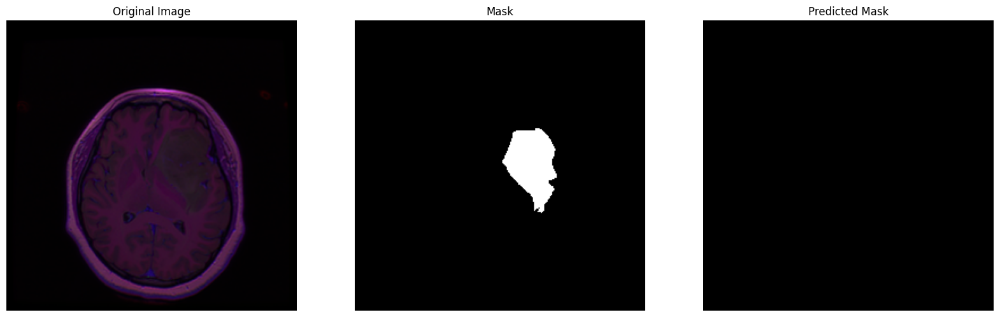

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_58.tif


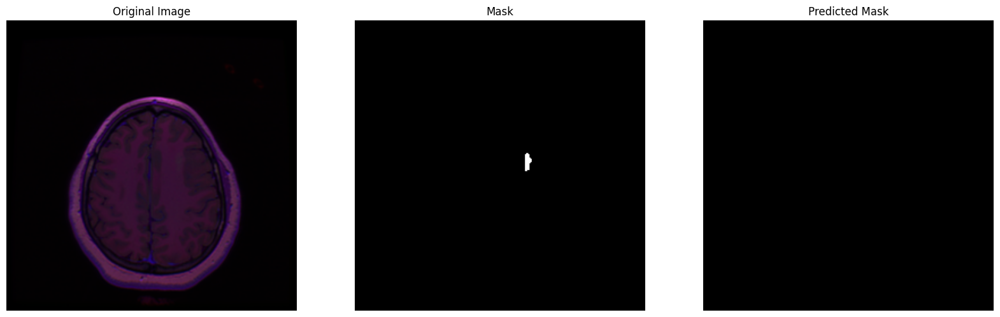

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_33.tif


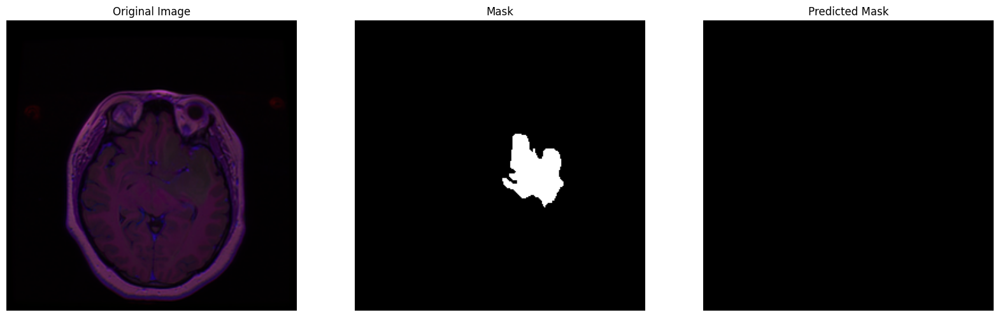

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_29.tif


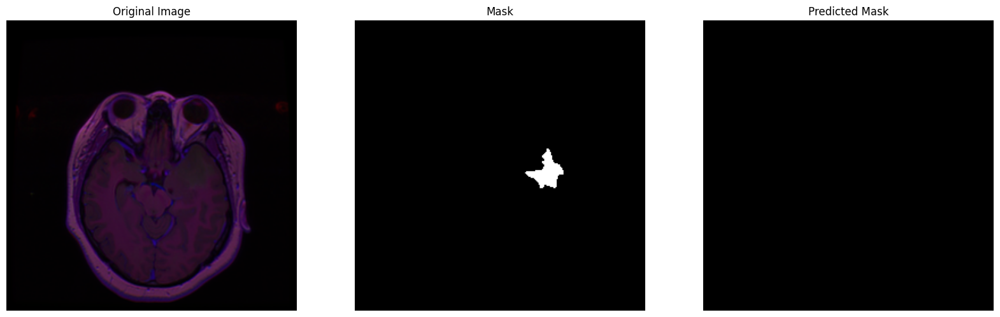

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_39.tif


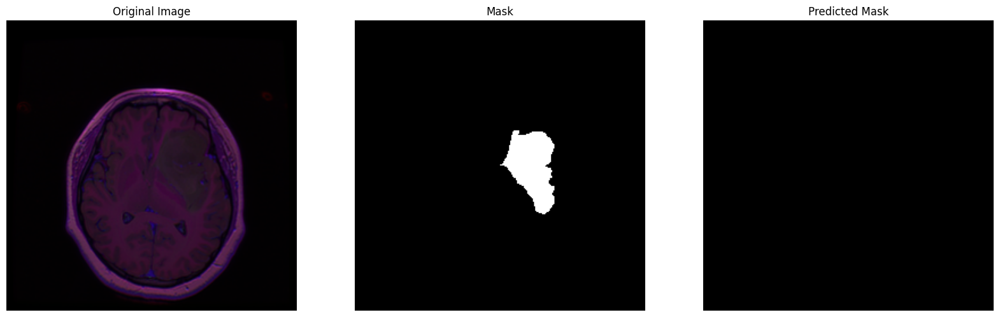

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_35.tif


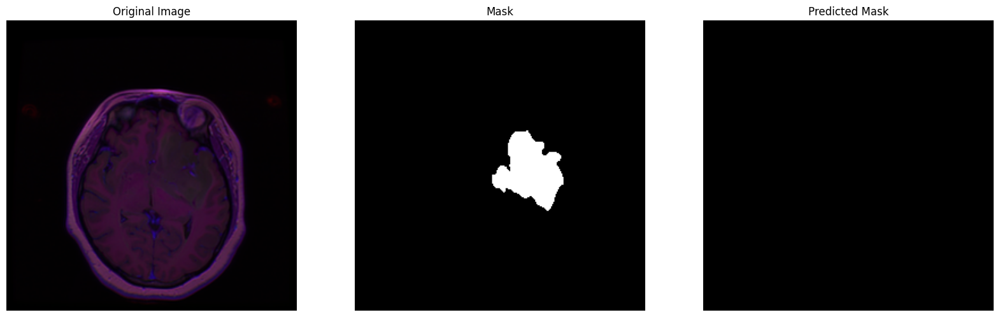

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_23.tif


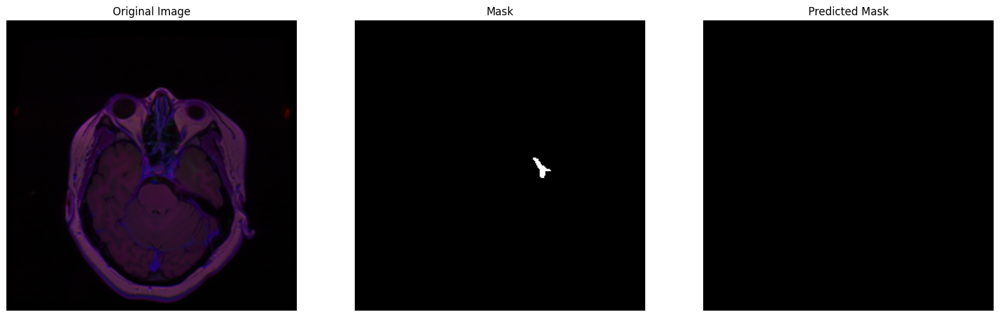

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_38.tif


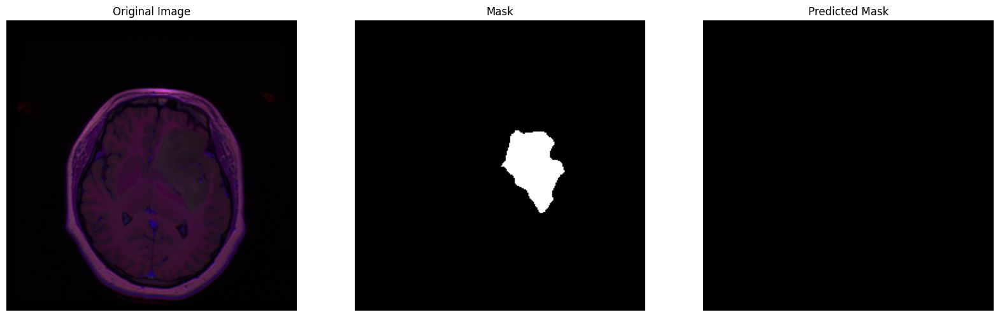

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_30.tif


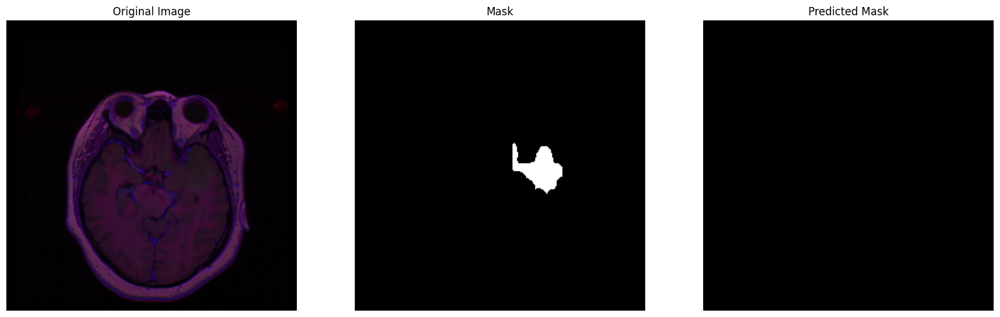

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_27.tif


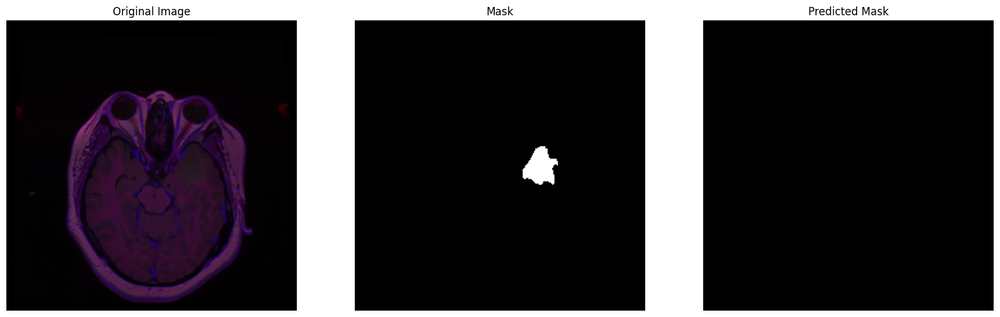

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_31.tif


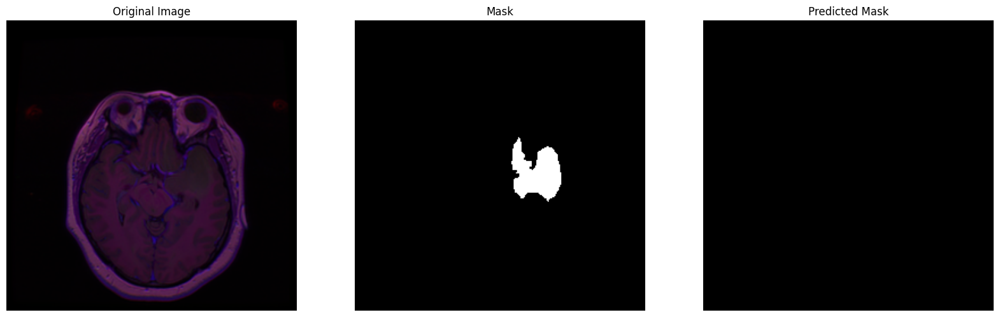

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_47.tif


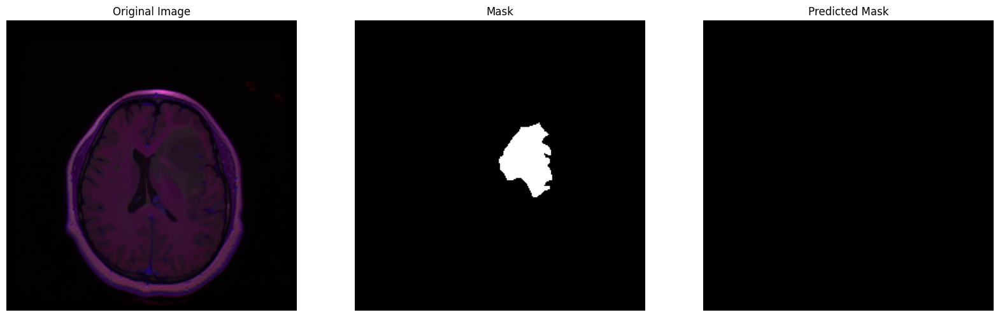

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_25.tif


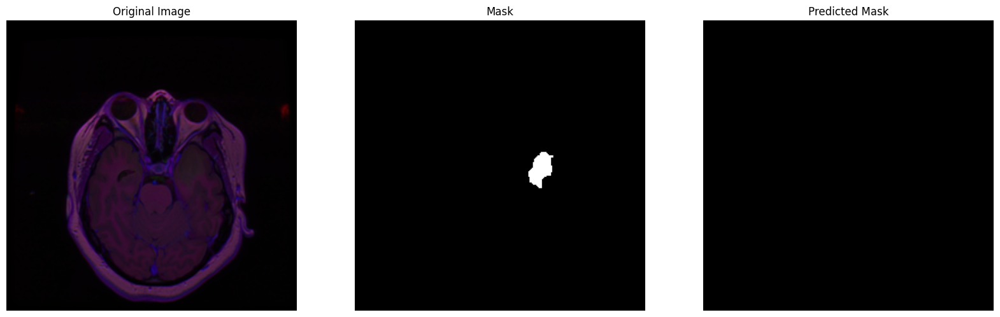

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_26.tif


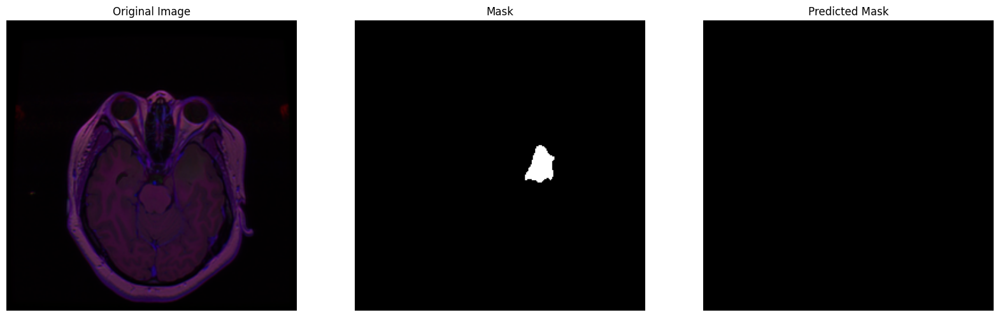

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_41.tif


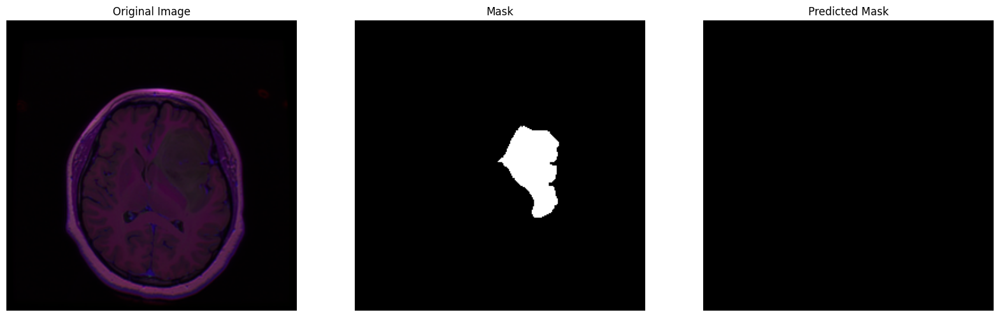

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_24.tif


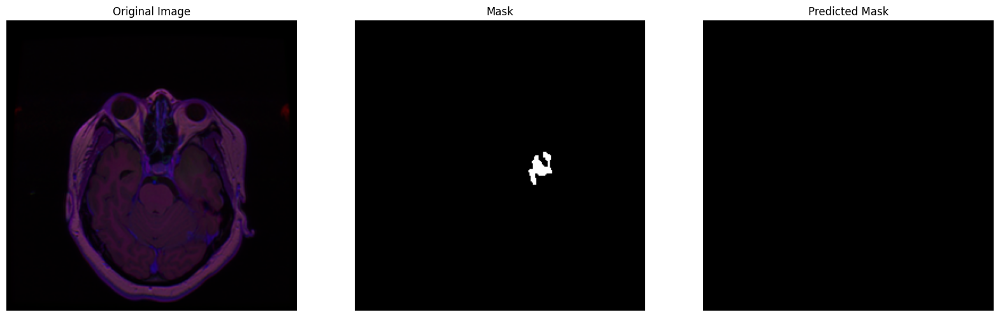

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_56.tif


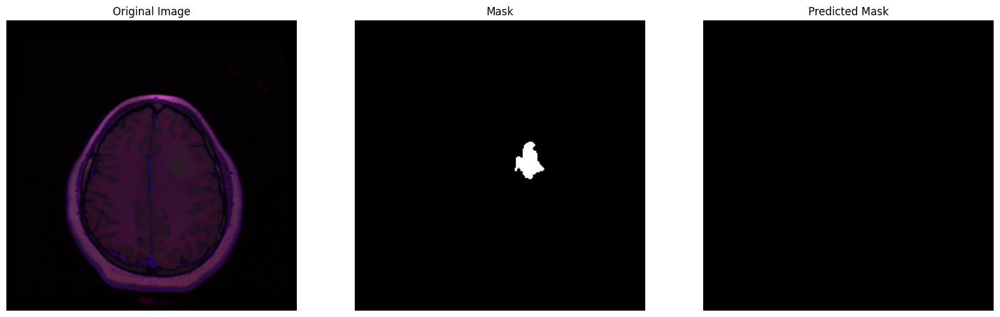

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_43.tif


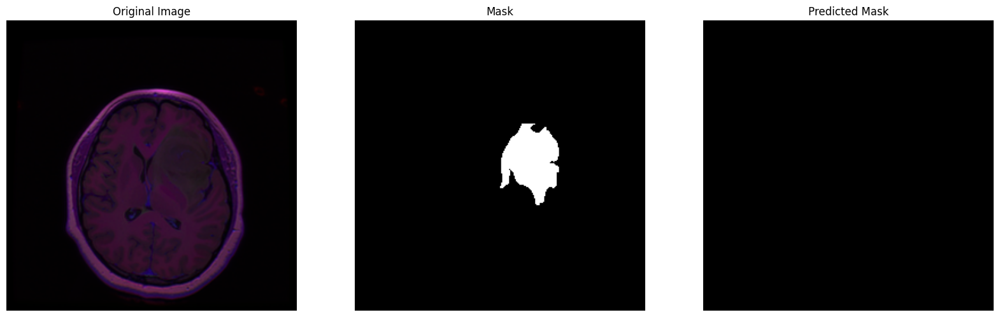

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_45.tif


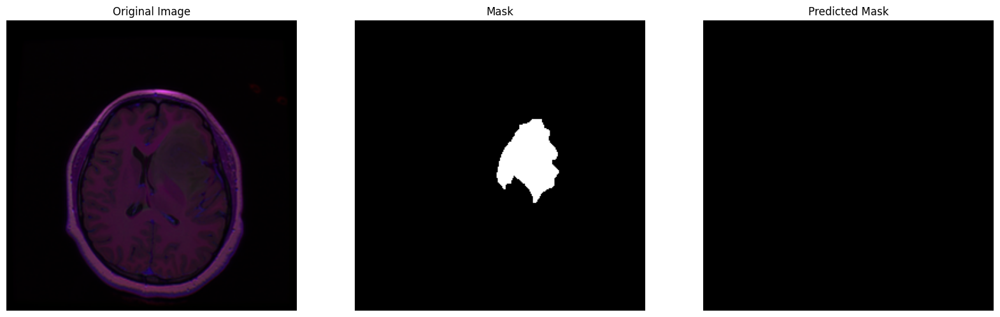

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_55.tif


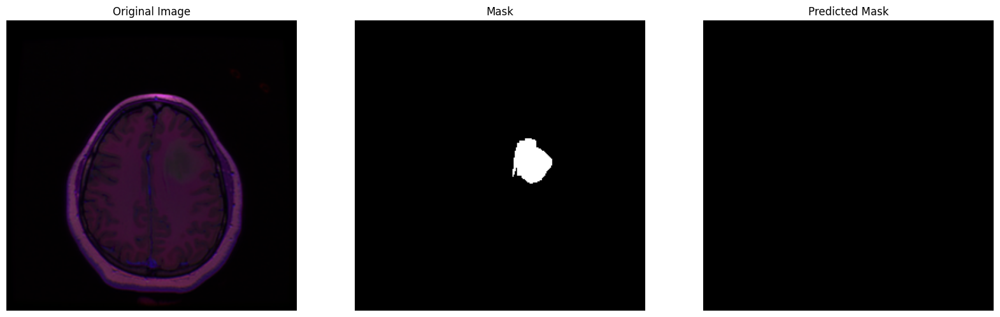

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_57.tif


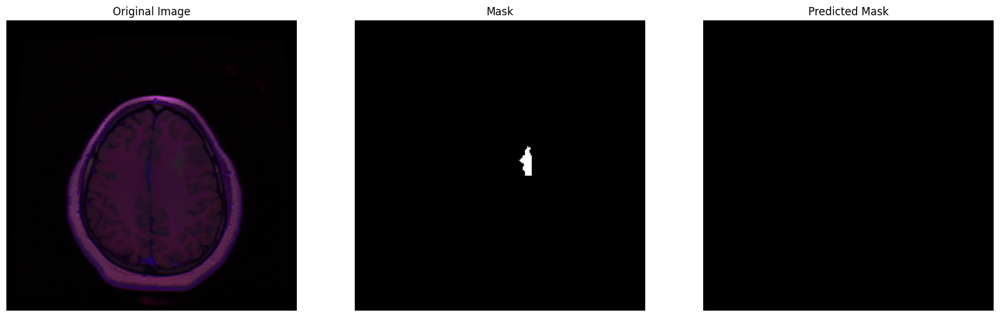

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_53.tif


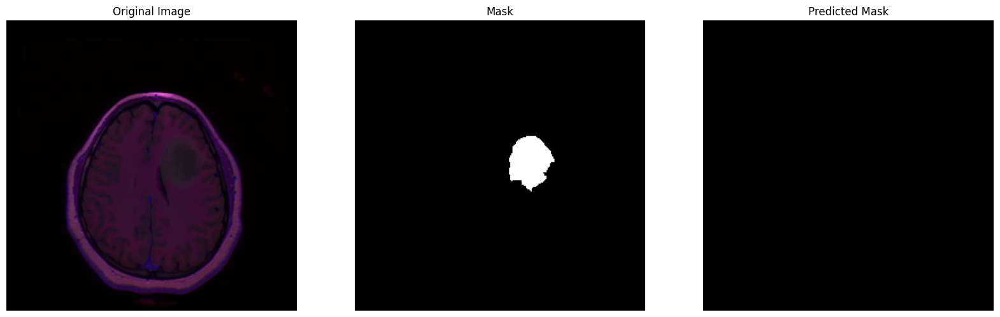

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_49.tif


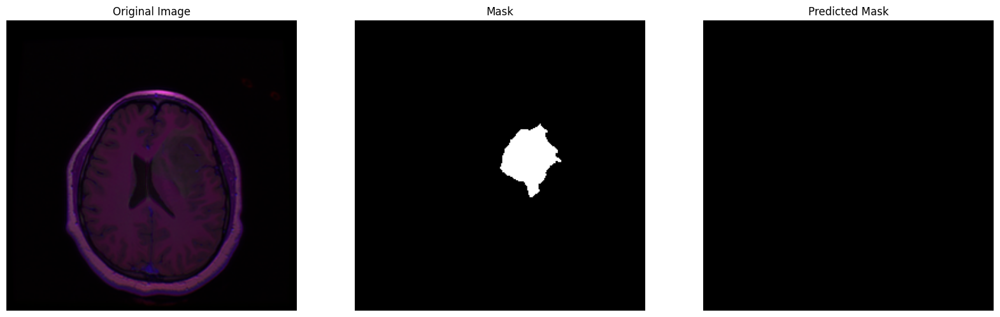

In [ ]:
for image_path, mask_path in zip(tumors["image_path"][:40], tumors["mask_path"][:40]):
    print(image_path)
    predicted_mask = predict_mask(model, image_path, device)
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    print_res(image, mask, predicted_mask)

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_7.tif


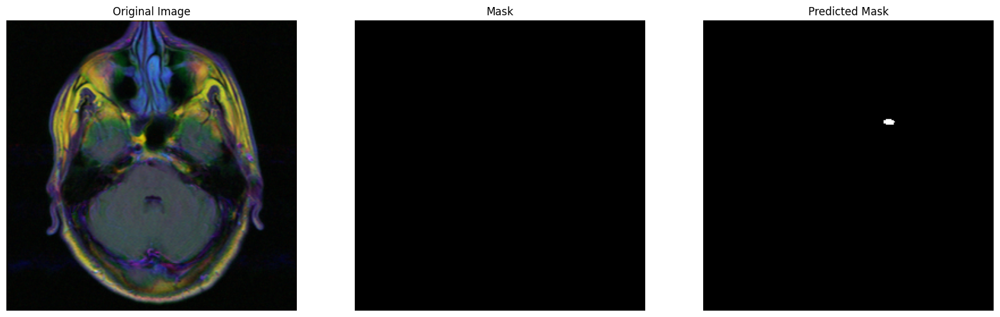

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_11.tif


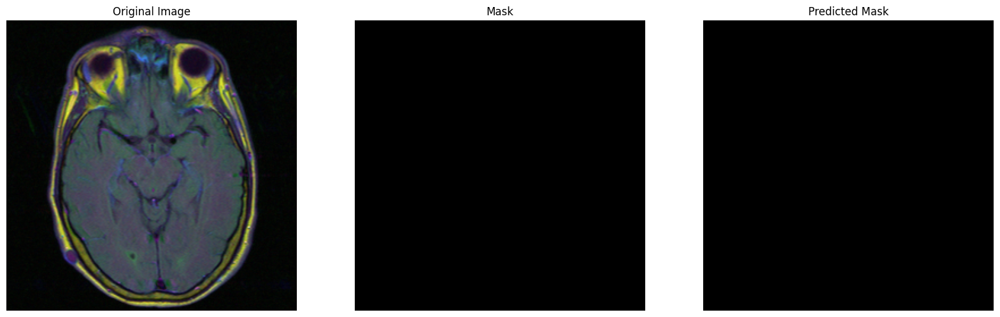

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_10.tif


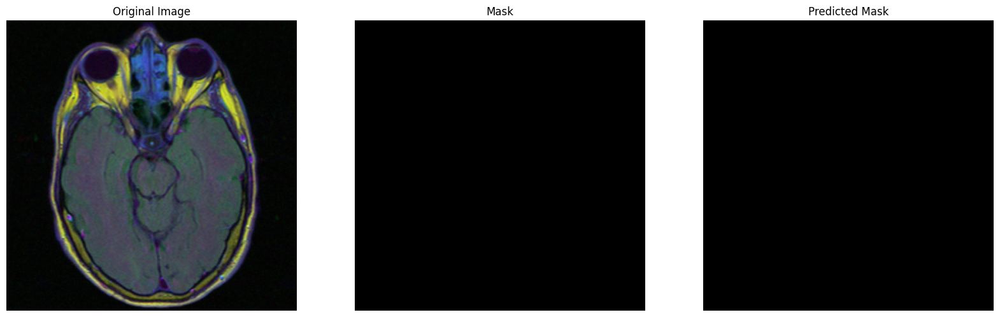

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_2.tif


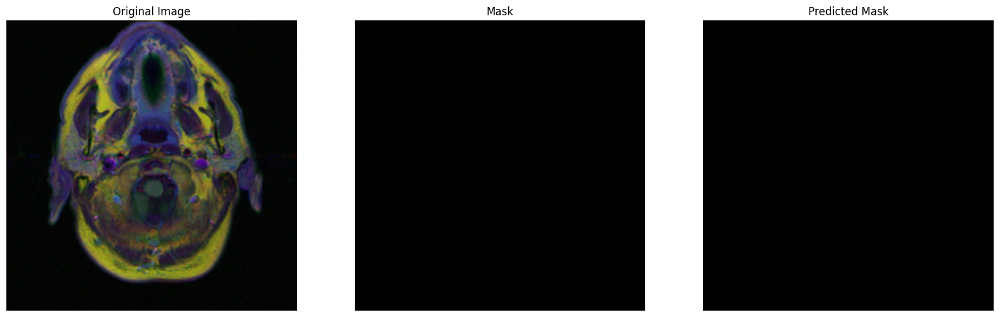

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_21.tif


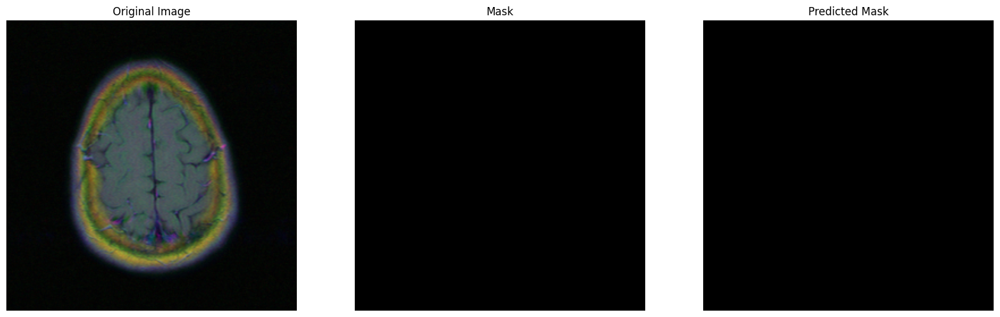

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_24.tif


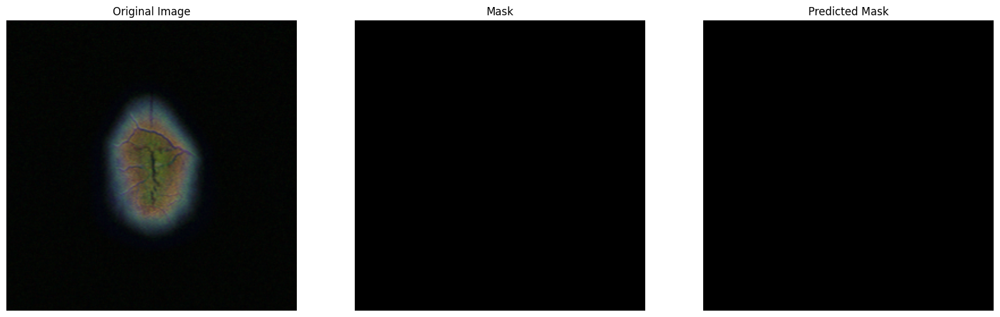

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_14.tif


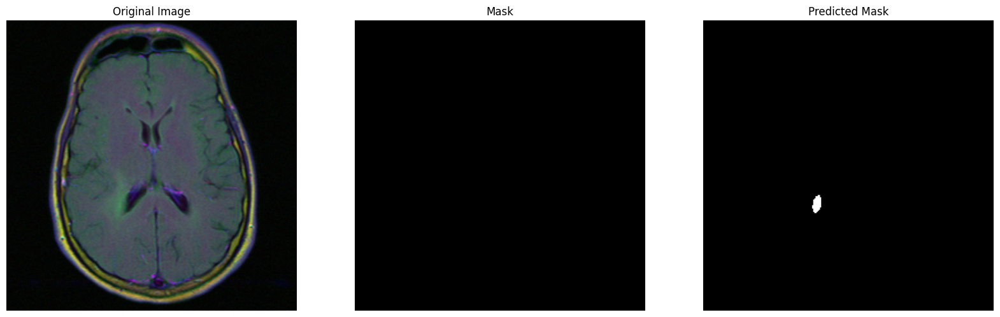

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_4.tif


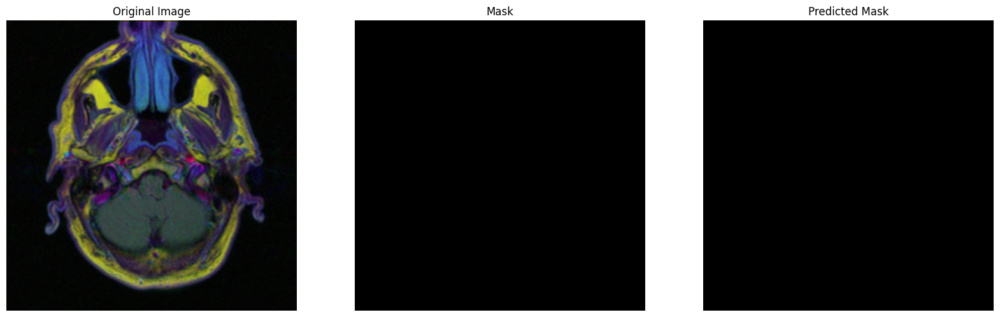

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_5.tif


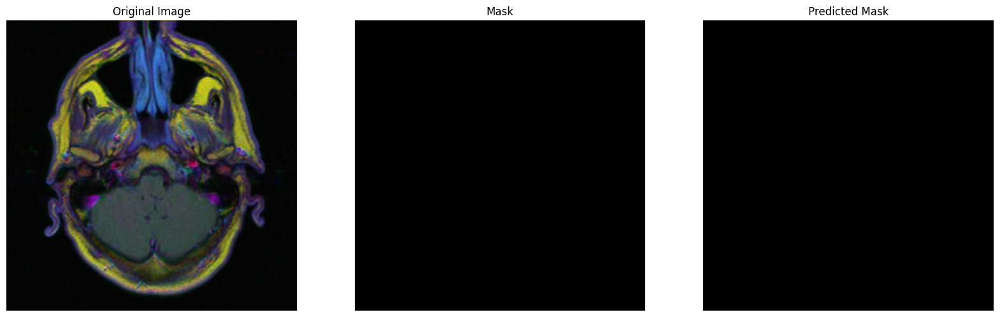

./lgg-mri-segmentation/kaggle_3m/TCGA_CS_6186_20000601/TCGA_CS_6186_20000601_22.tif


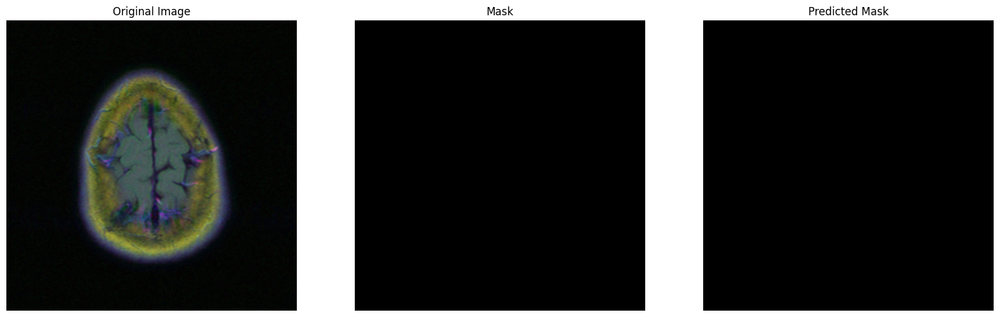

In [ ]:
for image_path, mask_path in zip(no_tumors["image_path"][:10], no_tumors["mask_path"][:10]):
    print(image_path)
    predicted_mask = predict_mask(model, image_path, device)
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    print_res(image, mask, predicted_mask)